<a href="https://colab.research.google.com/github/TosinPhillip/What-maker/blob/main/Car_model_Identifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
! pip install fastbook

In [17]:
from fastai.vision import *
from fastbook import *
from fastai.vision.widgets import ImageClassifierCleaner
#import DuckDuckGoImages as ddg

In [ ]:
cars = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    get_y=parent_label,
    splitter=RandomSplitter(valid_pct=0.2, seed=2),
    item_tfms=Resize(224)
)

In [ ]:
cars = cars.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.3),
    batch_tfms=aug_transforms()
)
c_dls = cars.dataloaders(source='/content/drive/MyDrive/Colab Notebooks/Cars')

In [ ]:
c_dls.valid.show_batch(max_n=15, nrows=3)

In [ ]:
learn = vision_learner(dls=c_dls, arch=resnet18, metrics=accuracy)
learn.fit_one_cycle(5)

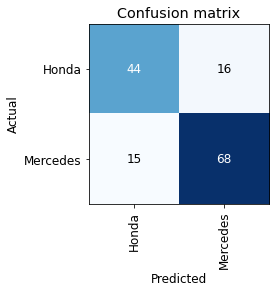

In [15]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

In [18]:
cleaner = ImageClassifierCleaner(learn)
cleaner

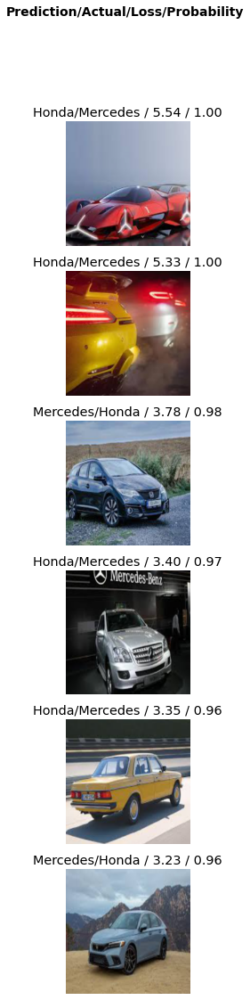

In [21]:
interp.plot_top_losses(6, nrows=6)

In [24]:
learn.export('/content/drive/MyDrive/Colab Notebooks/Cars/car_model_identifier.pkl')